## Useful functions

In [127]:
# libraries to import
import numpy as np
import matplotlib.pyplot as plt

from functions_week1_2 import *
from LinearBanditTS import *
from linear_regression import *



In [128]:
import matplotlib.pyplot as plt

def plot_regret(regrets):
    plt.plot(regrets)
    plt.xlabel('Time')
    plt.ylabel('Cumulative Regret')
    plt.title('Cumulative Regret as a Function of Time')
    plt.show()


# Week 4

## Goals and Objectives

### Make Thompson sampling algoirthm for linear bandits

In [129]:
def thompson_sampling_linear_bandits(d, item_features, true_theta, num_rounds, sigma_noise):

    # Initialize the linear bandit with Thompson Sampling
    bandit = LinearBanditTS(d, sigma_prior=1.0, sigma_noise=sigma_noise)

    # Initialize variables to keep track of the regrets and the number of times the best item is chosen
    regrets = np.zeros(num_rounds, dtype=float)
    differences = np.zeros(num_rounds, dtype=float)
    best_items = np.zeros(num_rounds, dtype=float)
    cumulative_regret = 0

    # Find the item with the highest dot product with the true theta
    for i in range(len(item_features)):
        if i == 0:
            best_item = i
        else:
            if true_theta @ item_features[i] > true_theta @ item_features[best_item]:
                best_item = i
    print("Best item index: ", best_item)
    print("Best item features: ", item_features[best_item])
    print("True theta: ", true_theta)

    for t in range(num_rounds):

        # Sample a theta from the current multivariate Gaussian distribution
        sampled_theta = bandit.sample_theta()
        print("Sampled theta: ", sampled_theta)
        # print difference for round t
        print("Round: "+ str(t) + "; Difference: " + str(np.sum(abs(true_theta - sampled_theta))))
        differences[t] = np.sum(abs(true_theta - sampled_theta))

        # Choose the item with the highest dot product with the sampled theta
        for i in range(len(item_features)):
            if i == 0:
                chosen_item = i
            else:
                if sampled_theta @ item_features[i] > sampled_theta @ item_features[chosen_item]:
                    chosen_item = i
        print("Chosen item index : ", chosen_item)

        # Compute the reward with noise and update the bandit
        reward = true_theta @ item_features[chosen_item] #- np.random.normal(0, sigma_noise)
        bandit.update(item_features[chosen_item], reward)

        # Update the regrets
        cumulative_regret += true_theta @ item_features[best_item] - true_theta @ item_features[chosen_item]
        regrets[t] = cumulative_regret

        # Check if the best item was chosen
        best_items[t] = 1.0 if chosen_item == best_item else 0.0
        print("best item: ", best_items[t])

    return regrets, best_items, differences

In [130]:
def run_and_plot_thompson_sampling(d, item_features, true_theta, num_rounds, sigma_noise, nbr_runs):
    regrets = np.zeros(num_rounds, dtype=float)
    differences = np.zeros(num_rounds, dtype=float)

    for run in range(nbr_runs):
        regret, _, difference = thompson_sampling_linear_bandits(d, item_features, true_theta, num_rounds, sigma_noise)
        regrets += regret
        differences += difference

    average_regrets = np.divide(regrets, nbr_runs)
    average_differences = np.divide(differences, nbr_runs)

    plt.plot(average_regrets)
    plt.xlabel("Number of Rounds")
    plt.ylabel("Average Regret")
    plt.title("Average Regret vs. Number of Rounds")
    plt.show()

    plt.plot(average_differences)
    plt.xlabel("Number of Rounds")
    plt.ylabel("Average Difference")
    plt.title("Average Difference vs. Number of Rounds")
    plt.show()

Best item index:  20
Best item features:  [0.94722922 0.99938178 0.89999739 0.38390125 0.45046475 0.57109288
 0.7571472  0.98307348 0.91450725 0.77225884]
True theta:  [0.16702137 0.41848633 0.75081894 0.1907182  0.7453728  0.52935317
 0.27848014 0.15308168 0.88925974 0.293535  ]
Sampled theta:  [ 0.93193716  0.14659385  2.68650978 -1.0015345   0.98530457  1.56588573
 -1.18191668  0.24655196  0.09675831  1.73849514]
Round: 0; Difference: 9.232544798160447
Chosen item index :  42
best item:  0.0
Sampled theta:  [ 1.30972261  0.56776982  0.83568674 -1.61641924  0.35967747 -1.00620075
  0.36800008  0.87339431 -0.37094099  1.10006091]
Round: 1; Difference: 7.981798413746016
Chosen item index :  11
best item:  0.0
Sampled theta:  [ 0.13989392  0.70487159  1.59929816 -0.60030575  1.09989356  0.89870694
 -0.38278034 -0.722963    1.50588999 -0.07221284]
Round: 2; Difference: 5.196573649444279
Chosen item index :  37
best item:  0.0
Sampled theta:  [-0.81670543  0.35138305 -0.08271669  0.490679

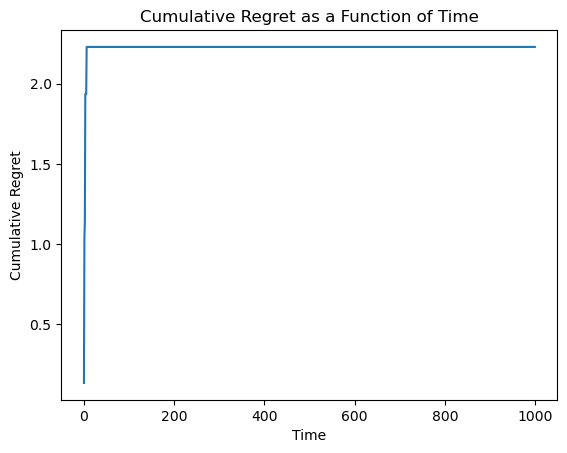

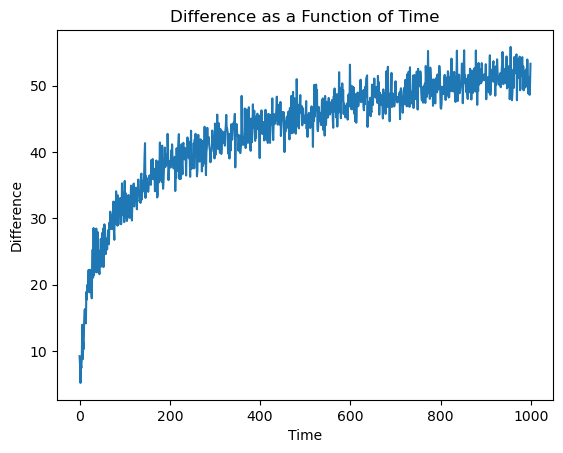

In [131]:
# Setup
d = 10
num_rounds = 1000
sigma_noise = 1.0
item_features = np.random.rand(50, d)
true_theta = np.random.rand(d)

regrets, best_items, differences = thompson_sampling_linear_bandits(d, item_features, true_theta, num_rounds, sigma_noise)

# Plot the regret
plot_regret(regrets)

# Plot the differences
plt.plot(differences)
plt.xlabel('Time')
plt.ylabel('Difference')
plt.title('Difference as a Function of Time')
plt.show()


Best item index:  6
Best item features:  [0.87951668 0.03336553 0.96616765]
True theta:  [0.77264498 0.27915376 0.86952072]
Sampled theta:  [ 0.71654807 -1.77993254 -0.24386187]
Round: 0; Difference: 3.228565805053538
Chosen item index :  7
best item:  0.0
Sampled theta:  [ 1.01729044 -1.27149842 -0.32014735]
Round: 1; Difference: 2.984965705465539
Chosen item index :  7
best item:  0.0
Sampled theta:  [ 1.45940931  1.22897593 -0.37958655]
Round: 2; Difference: 2.8856937601911494
Chosen item index :  5
best item:  0.0
Sampled theta:  [0.19006569 0.80716491 0.12788432]
Round: 3; Difference: 1.8522268311114076
Chosen item index :  5
best item:  0.0
Sampled theta:  [ 1.03833337  0.40707243 -0.17027016]
Round: 4; Difference: 1.4333979293930492
Chosen item index :  7
best item:  0.0
Sampled theta:  [0.85123904 0.7457339  1.001535  ]
Round: 5; Difference: 0.6771884682712199
Chosen item index :  6
best item:  1.0
Sampled theta:  [0.49611308 1.35331648 1.33834692]
Round: 6; Difference: 1.81952

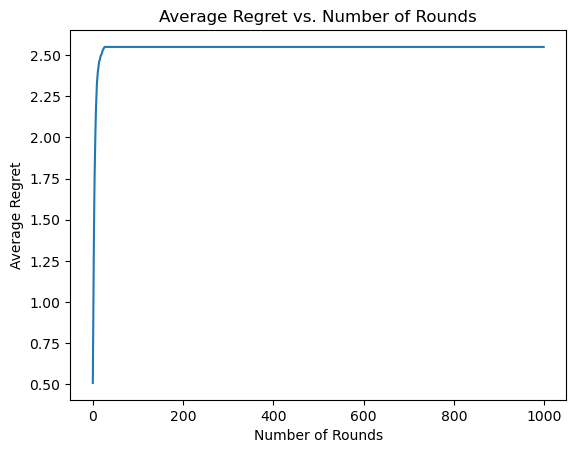

In [132]:
# Setup
d = 3
num_rounds = 1000
nbr_runs = 100
sigma_noise = 1.0
item_features = np.random.rand(10, d)
true_theta = np.random.rand(d)

run_and_plot_thompson_sampling(d, item_features, true_theta, num_rounds, sigma_noise, nbr_runs)
